# **MG&G Datascience Tutorial**

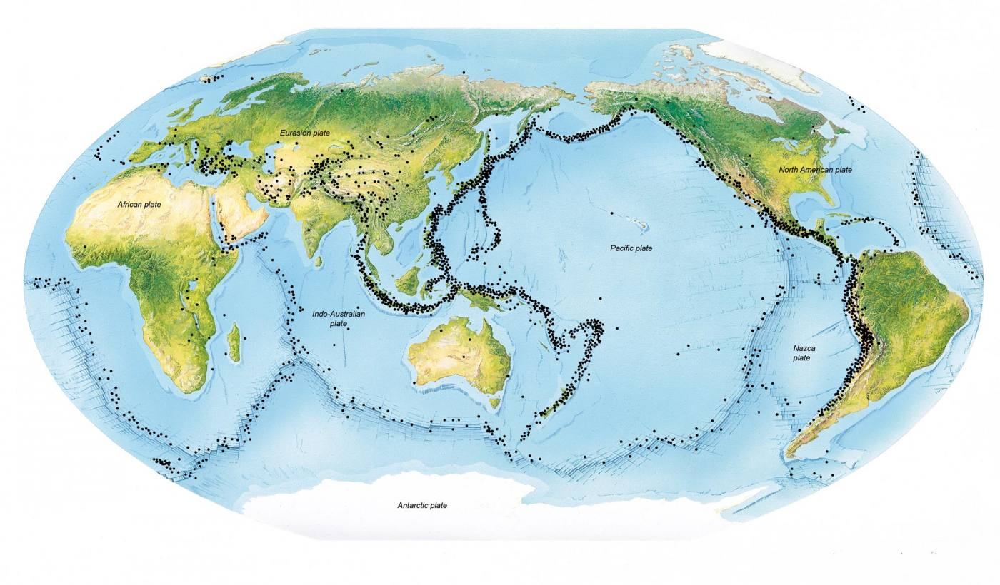

This tutorial is part of our Marine Geology and Geophysics day. It demonstrates how to do basic analysis and visualization of seafloor features, geologic, and seismic data. We will learn how to make maps of publicly available datasets of seafloor bathymetry, crustal age, and tectonic plate depth. We will then learn how to download data using python from the databases where seismic data are stored. Combining these techniques, we will learn to think like a geophysicist and use available data to draw connections between earthquake activity and geologic characteristics.

## **Tutorial Goals**


*   Python Skills
  *   List item
  *   List item


*   MG&G Knowledge
  *   Learn about how earth processes are derived from the bathymetry
  *   List item


### **Reading**

Bilek, Susan L., Susan Y. Schwartz, and Heather R. DeShon. "Control of seafloor roughness on earthquake rupture behavior." Geology 31.5 (2003): 455-458.

https://pubs.geoscienceworld.org/gsa/geology/article/31/5/455/198278/Control-of-seafloor-roughness-on-earthquake

# **Environment set-up**

to be filled out with instructions for new environment set-up

# Downloading earthquake data

The vast majority of seismic data is stored by IRIS, the *Incorporated Research Institutions for Seismology*.

IRIS stores seismometer waveform time series, seismometer station information, earthquake catalog data, and many, many, more seismic-related data products.

Much of the data we will be using today comes from IRIS, and we can download it remotely from this python notebook using the Number 1 package in seismology, obsPy!

obsPy connects to seismic databases using a client (see below). There are many other global clients but today we'll be connecting to IRIS. First, we are going to download earthquake data.

In [1]:
# Prepare to connect to the earthquake database, called IRIS

import obspy
from obspy.clients.fdsn import Client
client = Client("IRIS")

In [45]:
# Specify what times you want the data for
t1 = obspy.UTCDateTime(2000,7,1)
t2 = obspy.UTCDateTime(2010,7,1)

# Specify the minimum magnitude earthquake you want
minmagnitude = 5

# Note - you can also specify minimum/maximum latitudes/longitudes to get the data for.
# But for now, we won't specify
minlat = None
maxlat = None
minlon = None
maxlon = None

In [46]:
# Query the database for earthquakes within your timeframe
cat = client.get_events(starttime = t1, endtime = t2,minmagnitude=minmagnitude,minlatitude=minlat,minlongitude=minlon,maxlatitude=maxlat,maxlongitude=maxlon)

#### We now have a catalog object, which we see contains a number of earthquakes:

In [47]:
cat

18430 Event(s) in Catalog:
2010-06-30T22:34:32.870000Z | +22.979, +125.132 | 5.3  MW
2010-06-30T22:24:24.410000Z | -21.446,  -68.244 | 5.0  mb
...
2000-07-01T07:01:55.620000Z | +34.181, +139.161 | 6.1  Mw
2000-07-01T04:48:56.040000Z | -35.469, +178.742 | 5.7  Mw
To see all events call 'print(CatalogObject.__str__(print_all=True))'

#### We see that we can access individual earthquakes in the catalog by indexing, and we see that they have origin and magnitude information:

In [49]:
print('Earthquake with index 0 in the catalog was located at:')
print(str(cat[0].origins[0].longitude) + ' longitude, ' + str(cat[0].origins[0].latitude) + ' latitude, ' + str(cat[0].origins[0].depth) + ' depth')
print('And occurred at time:')
print(cat[0].origins[0].time.datetime)
print('With a magnitude of:')
print(cat[0].magnitudes[0].mag)

Earthquake with index 0 in the catalog was located at:
125.1315 longitude, 22.9794 latitude, 34300.0 depth
And occurred at time:
2010-06-30 22:34:32.870000
With a magnitude of:
5.3


#### The time, location (lat, lon, depth), and magnitude information is of most interest to us. We can take this information from each earthquake catalog and organize it more neatly into a tabular format as a pandas dataframe.

In [48]:
import pandas as pd

# This returns an earthquake catalog object, which we can reorganize into a pandas dataframe
times = [ev.origins[0].time.datetime for ev in cat]
lats = [ev.origins[0].latitude for ev in cat]
lons = [ev.origins[0].longitude for ev in cat]
mags = [ev.magnitudes[0].mag for ev in cat]
depths = [ev.origins[0].depth for ev in cat]

origin_dict = {'time':times,'latitude':lats,'longitude':lons,'depth':depths,'magnitude':mags}

events = pd.DataFrame.from_dict(origin_dict)
events['time'] = [str(t) for t in events['time']]
events.head()

,time,latitude,longitude,depth,magnitude
0,2010-06-30 22:34:32.870000,22.9794,125.1315,34300.0,5.3
1,2010-06-30 22:24:24.410000,-21.4464,-68.2437,116500.0,5.0
2,2010-06-30 15:17:10.190000,-55.4107,-27.8814,26000.0,5.3
3,2010-06-30 10:54:51.810000,-0.8169,99.6697,85900.0,5.0
4,2010-06-30 07:22:27.710000,16.2901,-97.9585,27800.0,6.3


# Interactive maps of global earthquakes

#### Now that we have our basic earthquake information, let's visualize where they are in the world! Here we'll make some cool interactive maps that you can access as an html product. To do so we will use the package called plotly.

In [11]:
import pathlib
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px

In [12]:
# First get time in the correct format
events['time']=pd.to_datetime(events['time'],format='%Y-%m-%d %H:%M:%S.%f')

Let's add some new columns to our dataframe to help us plot them more easily.

In [14]:
events['year'] = pd.DatetimeIndex(events['time']).year # add year as a category to group by
events['marker_size'] = np.fix(np.exp(events['magnitude'])) # add marker size as exp(mag)
# events['place']=pd.DatetimeIndex(events['i']).year 

#### Make an animation that goes through years and plots a histogram of earthquake numbers through time:

In [19]:
fig = px.histogram(events[events.magnitude>2], #specify what dataframe to use
             x="magnitude",  #specify the variable for the histogram 
             animation_frame="year", #this is the parameter controlling the animation
             nbins=50, #number of bins for the histogram
             range_x=[2,9], #x and y ranges for the axis such that the axis don't wobble around
             range_y=[0,10], 
             height=400, #dimensions of the figure
             width=600);
fig.write_html("EarthquakesHistogram.html")

#### You can see that the above code cell wrote a file to your current directory with the file root .html. Click on that file in order to view and interact with your new plot!

#### Now make an animated map of the earth that iterates through time:

In [18]:
fig = px.scatter_geo(events[events.magnitude>5],
                     lat='latitude',lon='longitude', 
                     size='marker_size', color='magnitude',
                     hover_name='year', hover_data=['magnitude','depth','latitude','longitude', 'time'], 
                     range_color=(6,9),
                     height=800, width=1400,
                     animation_frame="year");
fig.update_geos(resolution=50, showcountries=True)
fig.write_html("EarthquakesYears.html")

#### Now use an orthographic projection to look at different places on the globe:

In [ ]:
fig = px.scatter_geo(events[events.magnitude>5],
                     lat='latitude',lon='longitude', 
                     size='marker_size', color='magnitude',
                     hover_name='year', hover_data=['magnitude','depth','latitude','longitude', 'time'], 
                     range_color=(5,9),
                     height=800, width=1400)
fig.update_geos(resolution=50, showcountries=True, showlakes=True,projection_type='orthographic')
fig.show()
fig.write_html("EarthquakesMag6+.html")

As you can see on the interactive maps, a particularly active location is an area off the coast of the northwest United States. To see why this might be, we can look at the topography of the seafloor in that area. We call seafloor topography data "bathymetry".


# Detailed non-interactive maps

Let's zoom in on our location of interest and start to look at the bathymetry of the ocean floor at that location, to see it suggests a connection between the earthquake locations and seafloor features.

Bathymetry datasets are compiled from decades of ship-based seafloor mapping. Scientists work really hard to make this data available to the community. Marine geophysicists primarily get their bathymetry data from the GMRT dataset:

*"The Global Multi-Resolution Topography (GMRT) synthesis is a multi-resolutional compilation of edited multibeam sonar data collected by scientists and institutions worldwide, that is reviewed, processed and gridded by the GMRT Team and merged into a single continuously updated compilation of global elevation data"*


see https://www.gmrt.org/ for more information.

We can request it from the GMRT database by building a URL and then using a URL request.

In [38]:
# Specify coordinates for the bathymetry grid we want
minlat = 39
maxlat = 50
minlon = -135
maxlon = -123

In [39]:
# We build a URL which will automatically download a bathymetry grid to our specifications
url = 'https://www.gmrt.org/services/GridServer?north=' + str(maxlat) + '&west=' + str(minlon) + '&east=' + str(maxlon) + '&south=' + str(minlat) + '&layer=topo&format=netcdf&resolution=high' 
print(url)

https://www.gmrt.org/services/GridServer?north=50&west=-135&east=-123&south=39&layer=topo&format=netcdf&resolution=high


In [40]:
# Urllib is a built in library in python
import urllib.request 

# The grid will download to your current directory as a netCDF file with a specified name
urllib.request.urlretrieve(url,'cascadia_bathy.nc')

('cascadia_bathy.nc', <http.client.HTTPMessage at 0x13fc4ed70>)

Great, now we have our bathymetry grid! To make nice maps, a tool most geophysicists use is called GMT (Geophysical Mapping Tools), which allows very specified user inputs for map properties that render as beautiful, publication-ready maps.

It now has a nice implementation as a python package called pyGMT.

Let's use that to plot up our bathymetry!

In [41]:
import pygmt

# Specify the filename of the bathymetry data
topo_data = 'cascadia_bathy.nc'

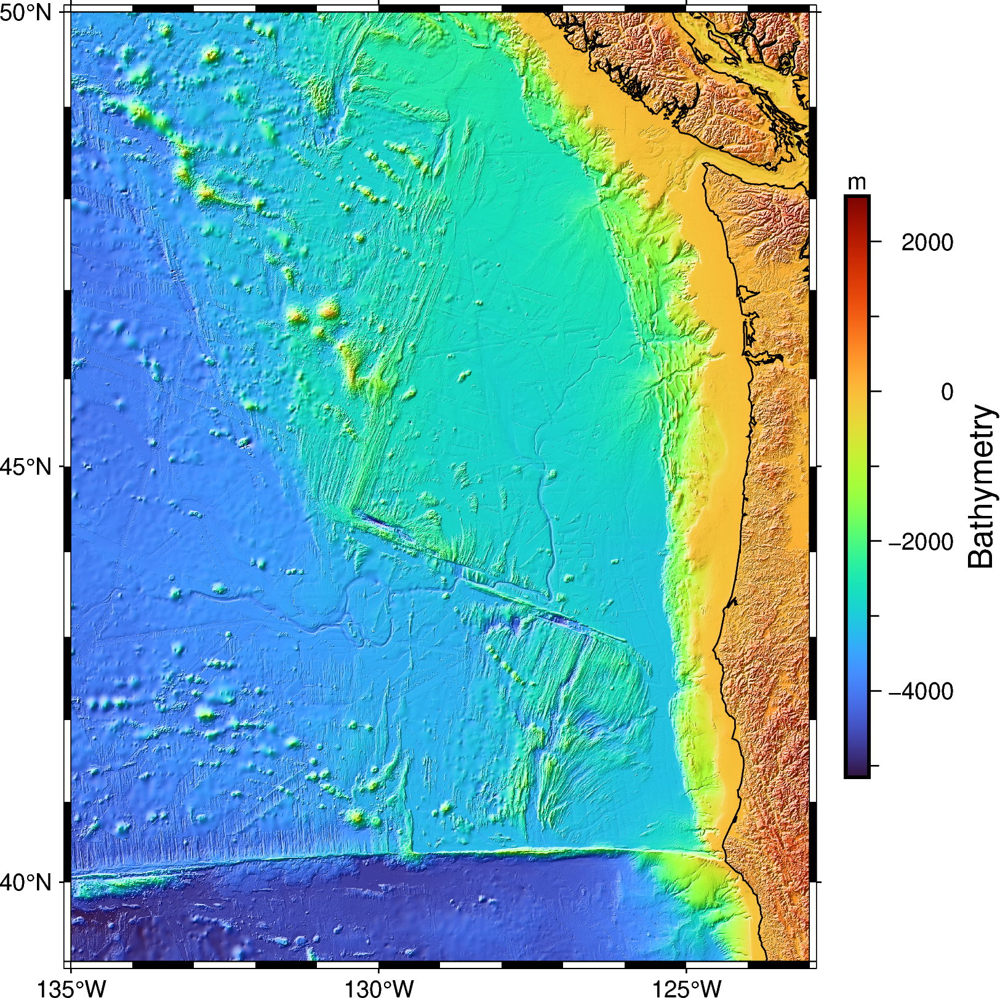

In [52]:
fig = pygmt.Figure()

# Plot the grid data
fig.grdimage(
    grid=topo_data,
    region=[minlon, maxlon, minlat, maxlat],
    projection='M4i',
    shading=True,
    frame=True
    )

# Plot the coastlines
fig.coast(shorelines="1/0.5p")

# Add a colorbar
fig.colorbar(frame=["x+lBathymetry", "y+lm"],position="JMR+o0.5c/0c+w8c")

fig.show()

Do any features in the bathymetry stand out to you?

Let's see how our earthquake locations (which we previously saved as "lats" and "lons" arrays) relate to bathymetry.

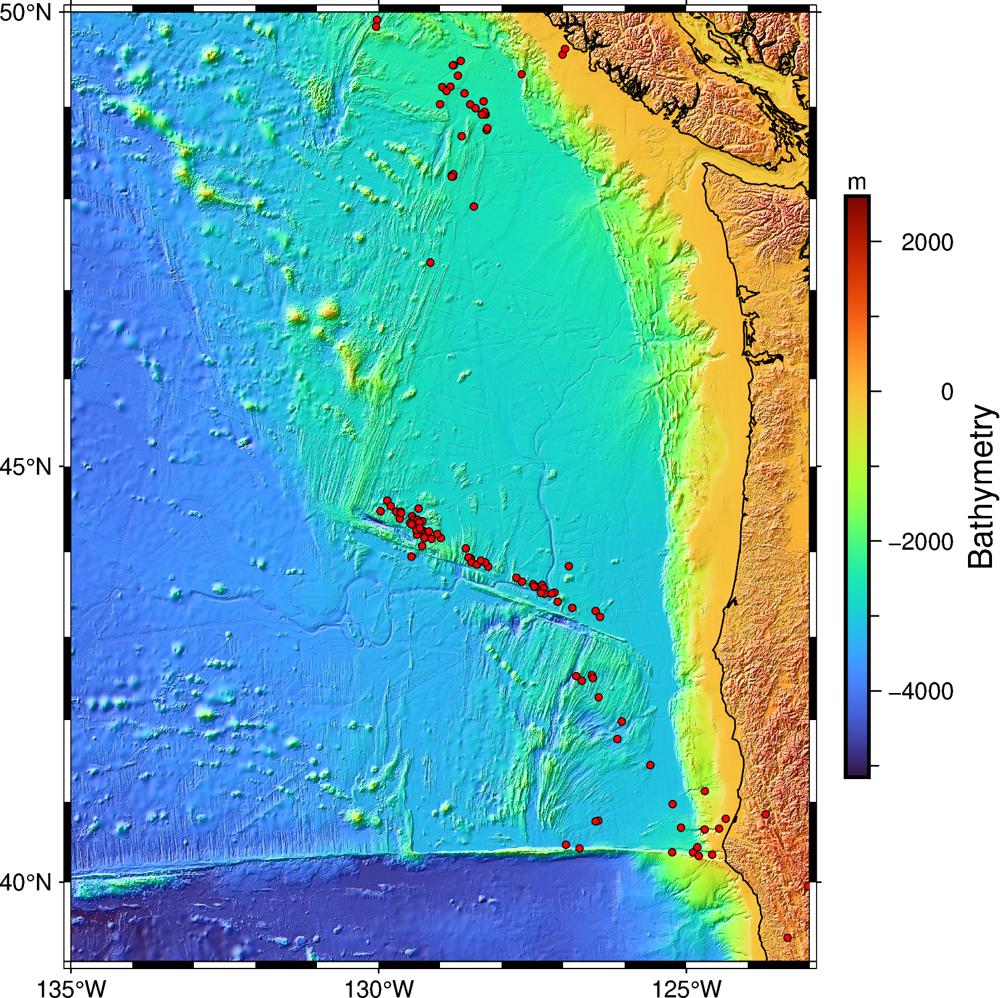

In [53]:
# Plot x/y points
fig.plot(
    x=lons,
    y=lats,
    style='c0.1c',
    color='red',
    pen='black',
    label='something',
    )
fig.show()

We can see there aren't too many large earthquakes occurring throughout the whole region. To get a better sense of the full scope of activity, we should plot smaller earthquakes.

# IN-CLASS EXERCISE NUMBER 1: 
Download earthquakes with a minimum magnitude of 2.5 for the chosen region from IRIS. Plot those earthquakes on the bathymetry map, with their size relating to magnitude.

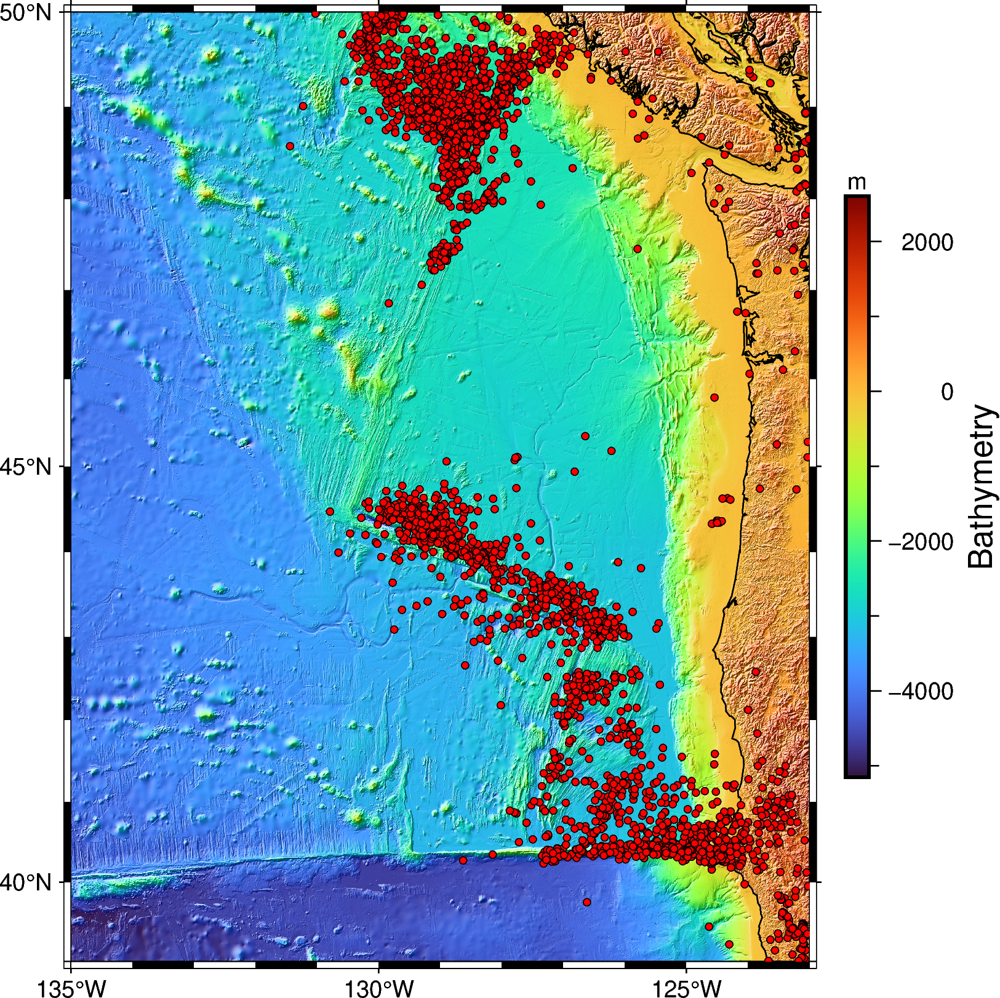

In [55]:
minmagnitude=2.5

# Query the database for earthquakes within your timeframe
cat = client.get_events(starttime = t1, endtime = t2,minmagnitude=minmagnitude,minlatitude=minlat,minlongitude=minlon,maxlatitude=maxlat,maxlongitude=maxlon)
times = [ev.origins[0].time.datetime for ev in cat]
lats = [ev.origins[0].latitude for ev in cat]
lons = [ev.origins[0].longitude for ev in cat]
mags = [ev.magnitudes[0].mag for ev in cat]
depths = [ev.origins[0].depth for ev in cat]

origin_dict = {'time':times,'latitude':lats,'longitude':lons,'depth':depths,'magnitude':mags}

events = pd.DataFrame.from_dict(origin_dict)
events['time'] = [str(t) for t in events['time']]

fig = pygmt.Figure()

# Plot the grid data
fig.grdimage(
    grid=topo_data,
    region=[minlon, maxlon, minlat, maxlat],
    projection='M4i',
    shading=True,
    frame=True
    )

# Plot the coastlines
fig.coast(shorelines="1/0.5p")

# Add a colorbar
fig.colorbar(frame=["x+lBathymetry", "y+lm"],position="JMR+o0.5c/0c+w8c")

# Plot x/y points
fig.plot(
    x=lons,
    y=lats,
    style='c0.1c',
    color='red',
    pen='black',
    label='something',
    )
fig.show()

We see that many of the earthquakes align with the bathymetric high that runs roughly north-south in the region. That is called the Juan de Fuca Ridge... (add paper here)

Could also note how there's nothing on Axial Seamount.. but it's super active just can't be observed by global seismometers because earthquakes are too small...

# Time Series Data - Earthquake Waveforms

The data we have been looking at, earthquake catalogs, were derived from observations of ground motion made using seismometers.

We wouldn't be real geophysicists if we didn't look at this ground motion data and see what an earthquake actually looks like in time series.

In [58]:
# See which seismic stations exist in our area of interest
# This is done the same way we pulled in earthquakes- by connecting to the IRIS client

# Let's look specifically at the seismometers on the Ocean Observatories Initiative cabled network
# This has been in place since 2015

t1 = obspy.UTCDateTime(2015,1,1)
t2 = obspy.UTCDateTime(2021,1,1)

inventory = client.get_stations(network="OO",
                                starttime=t1,
                                endtime=t2,
                               minlatitude = minlat, maxlatitude = maxlat, minlongitude = minlon, maxlongitude = maxlon)

#### We now have an inventory of seismic station information. We can see that all the stations have the same network, network code OO, just like we specified. We see there are 14 different stations in the inventory.

In [59]:
inventory

Inventory created at 2022-07-22T20:47:07.853000Z
	Created by: IRIS WEB SERVICE: fdsnws-station | version: 1.1.48
		    http://service.iris.edu/fdsnws/station/1/query?starttime=2015-01-...
	Sending institution: IRIS-DMC (IRIS-DMC)
	Contains:
		Networks (1):
			OO
		Stations (14):
			OO.AXAS1 (RSN Axial Ashes 1)
			OO.AXAS2 (RSN Axial Ashes 2)
			OO.AXBA1 (RSN Axial Base 1)
			OO.AXCC1 (RSN Axial East Caldera 1)
			OO.AXCC2 (RSN Axial Central Caldera 2)
			OO.AXEC1 (RSN Axial East Caldera 1)
			OO.AXEC2 (RSN Axial East Caldera 2)
			OO.AXEC3 (RSN Axial East Caldera 3)
			OO.AXID1 (RSN Axial International)
			OO.HYS11 (RSN Hydrate Summit 1-1)
			OO.HYS12 (RSN Hydrate Summit 1-2)
			OO.HYS13 (RSN Hydrate Summit 1-3)
			OO.HYS14 (RSN Hydrate Summit 1-4)
			OO.HYSB1 (RSN Hydrate Slope Base)
		Channels (0):


#### Let's look at one of the stations. We can access it using indexing. We see that it has location information stored:

In [63]:
sta1 = inventory[0].stations[5]
print(sta1)

Station AXEC1 (RSN Axial East Caldera 1)
	Station Code: AXEC1
	Channel Count: 0/12 (Selected/Total)
	2014-08-01T00:00:00.000000Z - 
	Access: open 
	Latitude: 45.95, Longitude: -129.98, Elevation: -1512.0 m
	Available Channels:



In [65]:
# Including latitude, longitude, and elevation
print(str(sta1.latitude))
print(str(sta1.longitude))
print(str(sta1.elevation))

45.949581
-129.979706
-1512.0


#### We can get a list of all the attributes of the stations similarly to how we navigated the earthquake catalog object-- for example:

In [68]:
lats = [sta.latitude for sta in inventory[0]]
lats

[45.933559,
 45.933769,
 45.820179,
 45.954681,
 45.955002,
 45.949581,
 45.939671,
 45.936069,
 45.925732,
 44.573029,
 44.5732,
 44.567402,
 44.569118,
 44.509781]

# IN-CLASS EXERCISE NUMBER 2:

Plot the locations of these seismic stations on your bathymetry map using triangle symbols. Hint: triangle symbol is denoted by ...

In [69]:
# need to code this 

Here a little blurb and links about the OOI... And Axial Seamount...

In [ ]:
# Let's find the time that the largest earthquake occurs in our catalog
eq_time = ...

In [ ]:
# Let's query the time series data for an hour surrounding that earthquake time

# Let's gather the information we need to query seismic waveforms

# A start and end time, let's call it 30 minutes before and after the pick time
t1 = eq_time - 30*60
t2 = eq_time + 30*60

# Now let's decide what station we want to pull data frome
# It has a network code, station code, location code, and several channels
# We can pull all channels of data from the station using a wildcard
network = pick.waveform_id.network_code
station = pick.waveform_id.station_code
location = pick.waveform_id.location_code
channel = pick.waveform_id.channel_code[0:2] + '*'



# Download the waveform, still using the IRIS client!
stream = client.get_waveforms(network,station,location,channel,t1,t2)

Now we have a "stream" object, which contains multiple channels of time series data.

We can plot it up nicely using the built in functions- let's look at the raw data. We can see the earthquake arrive in the middle of the window.

In [ ]:
stream.plot()

We see that each channel has metadata associated with it, including sampling rate information. Each channel is a separate "Trace" object.


In [ ]:
print(stream)
print(stream[0].stats)

The actual time series data is stored as a numpy array with each trace.

In [ ]:
stream[0].data

We can easily filter the waveforms using built in functions and see the difference in the plot.

In [ ]:
stream.filter('bandpass',freqmin=5,freqmax=15)
stream.plot();

This process of pulling in waveforms is highly flexible and can be done for any stations available in the IRIS DMC. This is a useful page to play around and browse what's available from IRIS:
http://ds.iris.edu/gmap/#network=XO&starttime=2013-01-01T00:00:00&endtime=2599-12-31T23:59:59&planet=earth